In [1]:
import math
import xarray as xr
import cartopy.crs as ccrs
import matplotlib as mpl
from matplotlib import pyplot as plt 
import matplotlib.pylab as plt
import matplotlib.path as mpath
from matplotlib.pyplot import figure
import numpy as np
import cartopy.feature as cfeature
from matplotlib.cm import get_cmap
import pyproj
import utm
import pandas as pd 
import traceback 
from pathlib import Path  
import os  
import numpy.ma as ma
import netCDF4 as nc
from netCDF4 import Dataset
import glob
import datetime as dt
import metpy.calc as mpcalc
from metpy.units import units
from metpy.cbook import get_test_data
from metpy.io import metar
from metpy.plots.declarative import (BarbPlot, ContourPlot, FilledContourPlot, MapPanel,
                                     PanelContainer, PlotObs)
from netCDF4 import date2num,num2date
import wrf
from wrf import (getvar, interplevel, to_np, latlon_coords, get_cartopy,
                 cartopy_xlim, cartopy_ylim)
from wrf import getvar, interplevel, to_np, get_basemap, latlon_coords

In [2]:
#D3_0 =  xr.open_dataset('/Users/Anna/Desktop/WRF/D3out/wrfout_d03_2018-03-25_00_00_00')
#D3_1 =  xr.open_dataset('/Users/Anna/Desktop/WRF/D3out/wrfout_d03_2018-03-25_01_00_00')
#D3_2 =  xr.open_dataset('/Users/Anna/Desktop/WRF/D3out/wrfout_d03_2018-03-25_02_00_00')
#D3_3 =  xr.open_dataset('/Users/Anna/Desktop/WRF/D3out/wrfout_d03_2018-03-25_03_00_00')
#D3_4 =  xr.open_dataset('/Users/Anna/Desktop/WRF/D3out/wrfout_d03_2018-03-25_04_00_00')
#D3_5 =  xr.open_dataset('/Users/Anna/Desktop/WRF/D3out/wrfout_d03_2018-03-25_05_00_00')
D3_6 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_06_00_00')
D3_7 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_07_00_00')
D3_8 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_08_00_00')
D3_9 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_09_00_00')
D3_10 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_10_00_00')
D3_11 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_11_00_00')
D3_12 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_12_00_00')
D3_13 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_13_00_00')
D3_14 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_14_00_00')
D3_15 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_15_00_00')
D3_16 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_16_00_00')
D3_17 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_17_00_00')
D3_18 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_18_00_00')
D3_19 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_19_00_00')
D3_20 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_20_00_00')
D3_21 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_21_00_00')
D3_22 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_22_00_00')
D3_23 =  xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_23_00_00')
D3_24 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-26_00_00_00')

In [3]:
print(D3_6.variables)


#U_STAR 
#stagger:      , 'UST': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
#[302886 values with dtype=float32]
#Attributes:
#    FieldType:    104
#    MemoryOrder:  XY 
#    description:  U* IN SIMILARITY THEORY
#    units:        m s-1
    
#Will need to calculated momentum flux: roh*(u_star)^2    

    
#PBLH
#    stagger:      , 'PBLH': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
#[302886 values with dtype=float32]
#Attributes:
#    FieldType:    104
#    MemoryOrder:  XY 
#    description:  PBL HEIGHT
#    units:        m
    
#SENSIBLE HEAT FLUX    
#    stagger:      , 'HFX': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
#[302886 values with dtype=float32]
#Attributes:
#    FieldType:    104
#    MemoryOrder:  XY 
#    description:  UPWARD HEAT FLUX AT THE SURFACE
#    units:        W m-2


#LATENT HEAT FLUX
#    stagger:      , 'LH': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
#[302886 values with dtype=float32]
#Attributes:
#    FieldType:    104
#    MemoryOrder:  XY 
#    description:  LATENT HEAT FLUX AT THE SURFACE
#    units:        W m-2

Frozen({'Times': <xarray.Variable (Time: 1)>
[1 values with dtype=|S19], 'XLAT': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
[302886 values with dtype=float32]
Attributes:
    FieldType:    104
    MemoryOrder:  XY 
    description:  LATITUDE, SOUTH IS NEGATIVE
    units:        degree_north
    stagger:      , 'XLONG': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
[302886 values with dtype=float32]
Attributes:
    FieldType:    104
    MemoryOrder:  XY 
    description:  LONGITUDE, WEST IS NEGATIVE
    units:        degree_east
    stagger:      , 'LU_INDEX': <xarray.Variable (Time: 1, south_north: 474, west_east: 639)>
[302886 values with dtype=float32]
Attributes:
    FieldType:    104
    MemoryOrder:  XY 
    description:  LAND USE CATEGORY
    units:        
    stagger:      , 'ZNU': <xarray.Variable (Time: 1, bottom_top: 99)>
[99 values with dtype=float32]
Attributes:
    FieldType:    104
    MemoryOrder:  Z  
    description:  eta values on h

In [3]:
#print(D3_4.variables)
print(D3_8.ZNU.values)
#print(D3_4.ZNU.shape) # (1,99)

#Eta values are basically normalized pressure. 
#A value of 1 corresponds to the surface. A value of zero corresponds to the model top. 
#For example, if the model top is 0 mb (which it isn't, of course), and the surface is 1000mb, then an eta value of 0.8 would correspond to 800 mb. 
#Eta values in the boundary layer are going to range from around 1 to .9 ish. Eta value in the free troposphere will range from .9 to .3ish.

#100 eta values for 5000mb top

#SFC = 0 (9.96907353e-01)
#MID BL = 5 (9.58004236e-01)
#FREE ATMO =  (5.12892842e-01)

print(D3_8.ZNU[0,0])
print(D3_8.ZNU[0,5])
print(D3_8.ZNU[0,28])



[[9.96907353e-01 9.90433812e-01 9.83359218e-01 9.75632608e-01
  9.67200041e-01 9.58004236e-01 9.47984874e-01 9.37078476e-01
  9.25218999e-01 9.12338018e-01 8.98365259e-01 8.83229375e-01
  8.66858482e-01 8.49181890e-01 8.30130756e-01 8.09640050e-01
  7.87650466e-01 7.64110446e-01 7.38979042e-01 7.13117898e-01
  6.87758446e-01 6.63238764e-01 6.39531136e-01 6.16608739e-01
  5.94445407e-01 5.73016047e-01 5.52296400e-01 5.32262921e-01
  5.12892842e-01 4.94164258e-01 4.76055920e-01 4.58547294e-01
  4.41618502e-01 4.25250351e-01 4.09424245e-01 3.94122243e-01
  3.79327059e-01 3.65021825e-01 3.51190329e-01 3.37816924e-01
  3.24886382e-01 3.12384039e-01 3.00295711e-01 2.88607776e-01
  2.77306914e-01 2.66380280e-01 2.55815506e-01 2.45600611e-01
  2.35724002e-01 2.26174474e-01 2.16941208e-01 2.08013713e-01
  1.99381888e-01 1.91035926e-01 1.82966352e-01 1.75164014e-01
  1.67620063e-01 1.60325944e-01 1.53273404e-01 1.46454409e-01
  1.39861226e-01 1.33486420e-01 1.27322733e-01 1.21363163e-01
  1.1560

In [4]:
lat0 =D3_8.XLAT.values
lon0 = D3_8.XLONG.values

#w_0 = D3_0.W.values
#poT_0 = D3_0.T.values
#w_1 = D3_1.W.values
#poT_1 = D3_1.T.values
#w_2 = D3_2.W.values
#poT_2 = D3_2.T.values
#w_3 = D3_3.W.values
#poT_3 = D3_3.T.values
#w_4 = D3_4.W.values
#poT_4 = D3_4.T.values
#w_5 = D3_5.W.values
#poT_5 = D3_5.T.values
w_6 = D3_6.W.values
poT_6 = D3_6.T.values
w_7 = D3_7.W.values
poT_7 = D3_7.T.values
w_8 = D3_8.W.values
poT_8 = D3_8.T.values
w_9 = D3_9.W.values
poT_9 = D3_9.T.values
w_10 = D3_10.W.values
poT_10 = D3_10.T.values
w_11 = D3_11.W.values
poT_11 = D3_11.T.values
w_12 = D3_12.W.values
poT_12 = D3_12.T.values
w_13 = D3_13.W.values
poT_13 = D3_13.T.values
w_14 = D3_14.W.values
poT_14 = D3_14.T.values
w_15 = D3_15.W.values
poT_15 = D3_15.T.values
w_16 = D3_16.W.values
poT_16 = D3_16.T.values
w_17 = D3_17.W.values
poT_17 = D3_17.T.values
w_18 = D3_18.W.values
poT_18 = D3_18.T.values
w_19 = D3_19.W.values
poT_19 = D3_19.T.values
w_20 = D3_20.W.values
poT_20 = D3_20.T.values
w_21 = D3_21.W.values
poT_21 = D3_21.T.values
w_22 = D3_22.W.values
poT_22 = D3_22.T.values
w_23 = D3_23.W.values
poT_23 = D3_23.T.values
w_24 = D3_24.W.values
poT_24 = D3_24.T.values

#Vapor Mixing Ratio / specific humidity q
#VMR_0=D3_0.QVAPOR.values
#VMR_1=D3_1.QVAPOR.values
#VMR_2=D3_2.QVAPOR.values
#VMR_3=D3_3.QVAPOR.values
#VMR_4=D3_4.QVAPOR.values
#VMR_5=D3_5.QVAPOR.values
VMR_6=D3_6.QVAPOR.values
VMR_7=D3_7.QVAPOR.values
VMR_8=D3_8.QVAPOR.values
VMR_9=D3_9.QVAPOR.values
VMR_10=D3_10.QVAPOR.values
VMR_11=D3_11.QVAPOR.values
VMR_12=D3_12.QVAPOR.values
VMR_13=D3_13.QVAPOR.values
VMR_14=D3_14.QVAPOR.values
VMR_15=D3_15.QVAPOR.values
VMR_16=D3_16.QVAPOR.values
VMR_17=D3_17.QVAPOR.values
VMR_18=D3_18.QVAPOR.values
VMR_19=D3_19.QVAPOR.values
VMR_20=D3_20.QVAPOR.values
VMR_21=D3_21.QVAPOR.values
VMR_22=D3_22.QVAPOR.values
VMR_23=D3_23.QVAPOR.values
VMR_24=D3_24.QVAPOR.values

#PBL Height
#PBLH_0=D3_0.PBLH.values
#PBLH_1=D3_1.PBLH.values
#PBLH_2=D3_2.PBLH.values
#PBLH_3=D3_3.PBLH.values
#PBLH_4=D3_4.PBLH.values
#PBLH_5=D3_5.PBLH.values
PBLH_6=D3_6.PBLH.values
PBLH_7=D3_7.PBLH.values
PBLH_8=D3_8.PBLH.values
PBLH_9=D3_9.PBLH.values
PBLH_10=D3_10.PBLH.values
PBLH_11=D3_11.PBLH.values
PBLH_12=D3_12.PBLH.values
PBLH_13=D3_13.PBLH.values
PBLH_14=D3_14.PBLH.values
PBLH_15=D3_15.PBLH.values
PBLH_16=D3_16.PBLH.values
PBLH_17=D3_17.PBLH.values
PBLH_18=D3_18.PBLH.values
PBLH_19=D3_19.PBLH.values
PBLH_20=D3_20.PBLH.values
PBLH_21=D3_21.PBLH.values
PBLH_22=D3_22.PBLH.values
PBLH_23=D3_23.PBLH.values
PBLH_24=D3_24.PBLH.values

print(PBLH_10.shape)

(1, 474, 639)


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


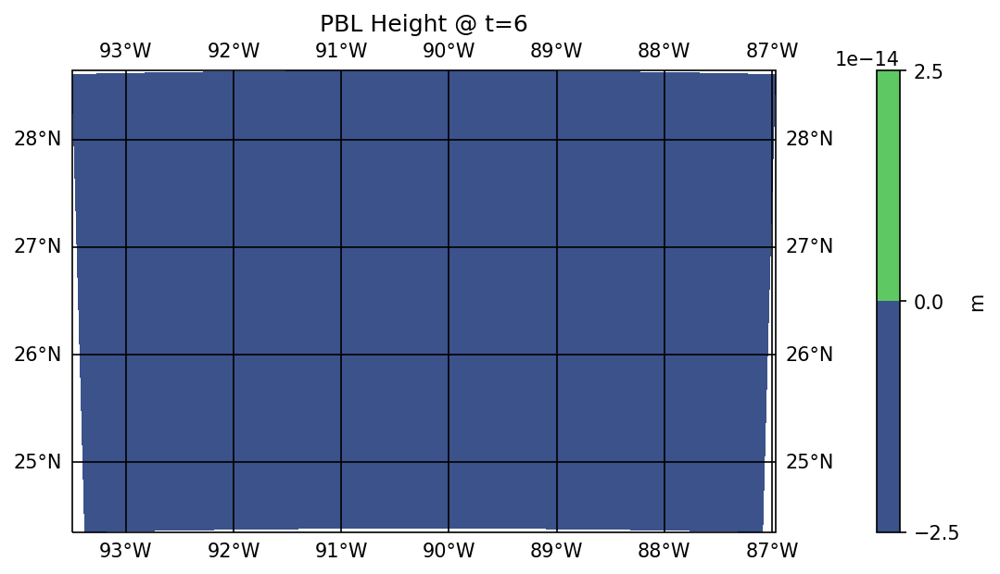

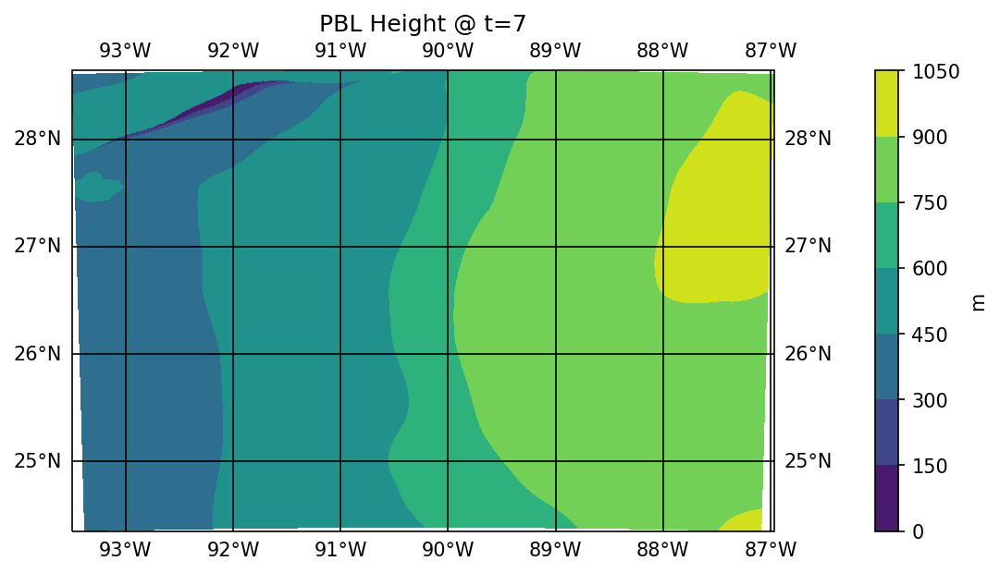

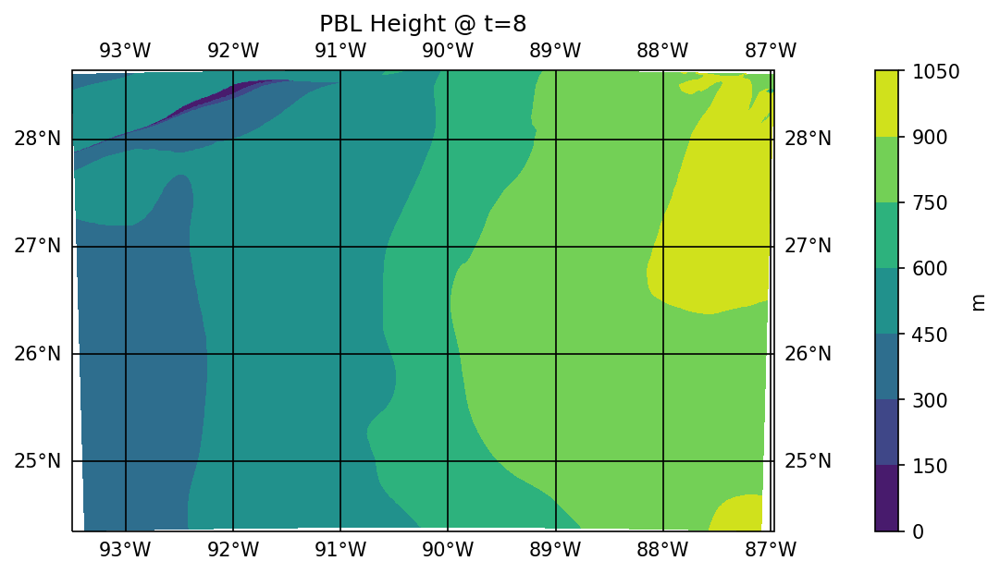

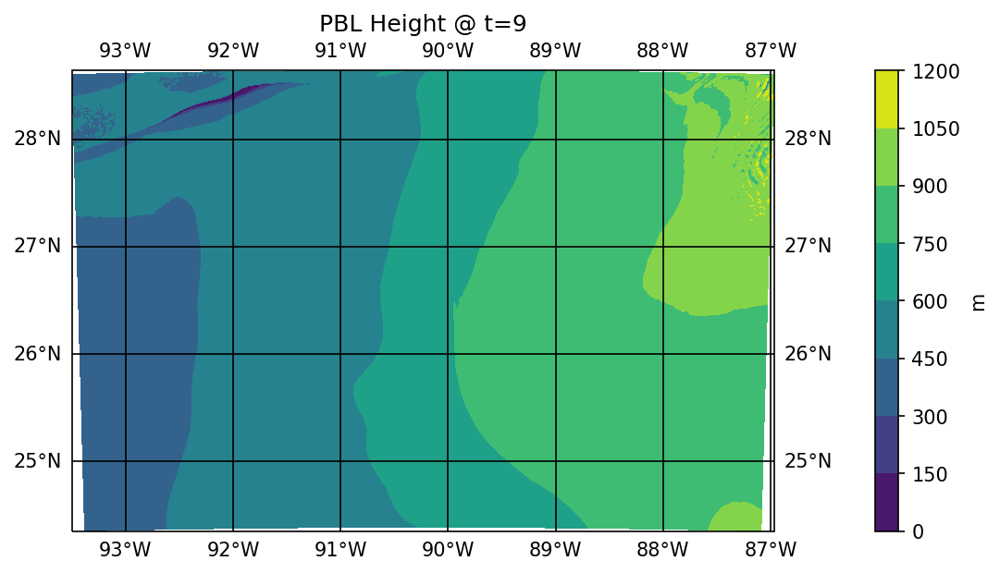

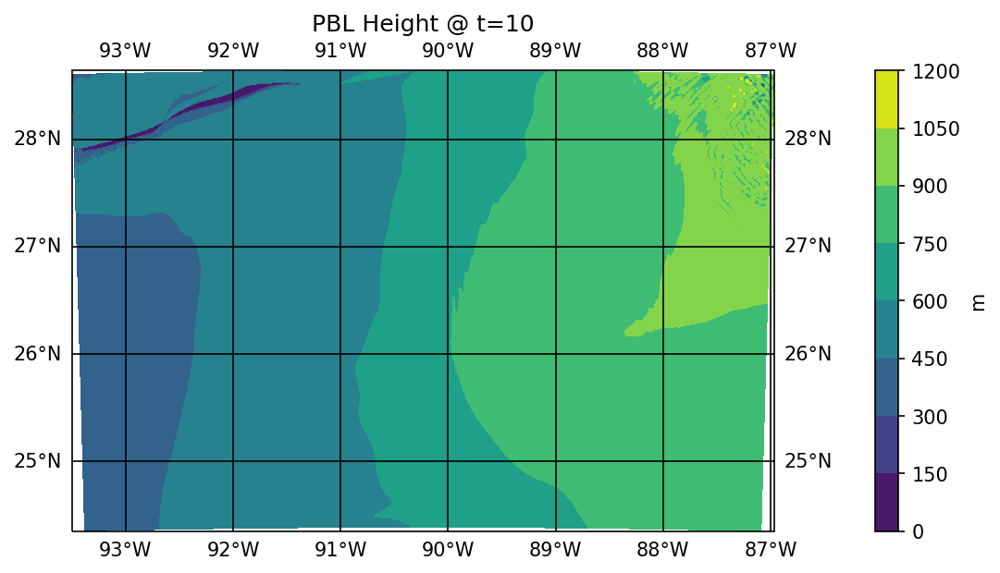

...

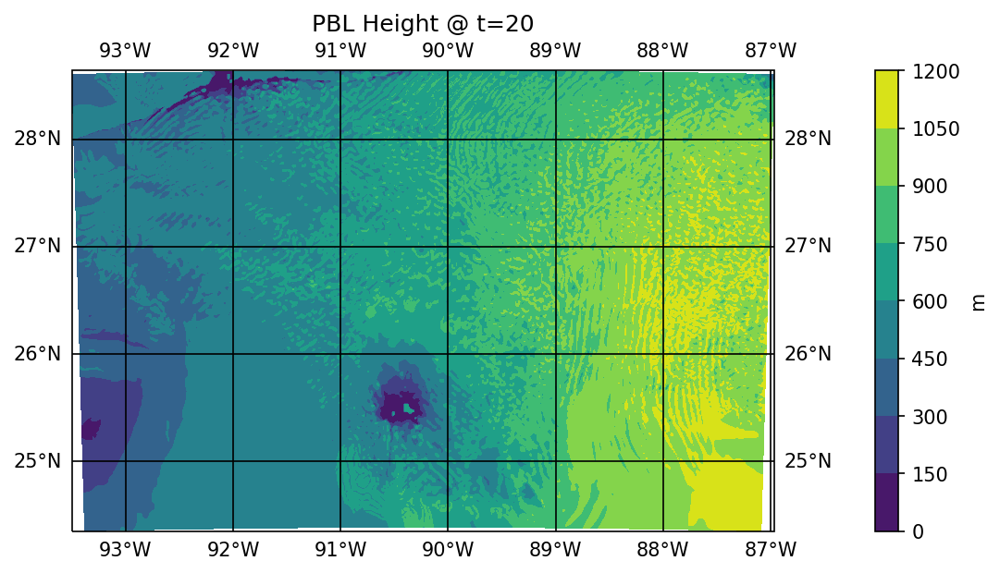

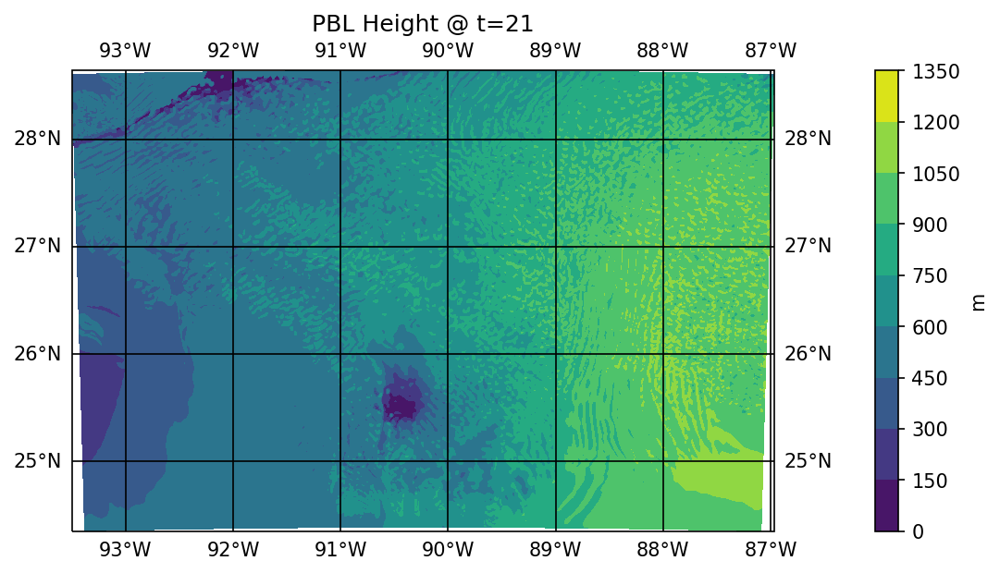

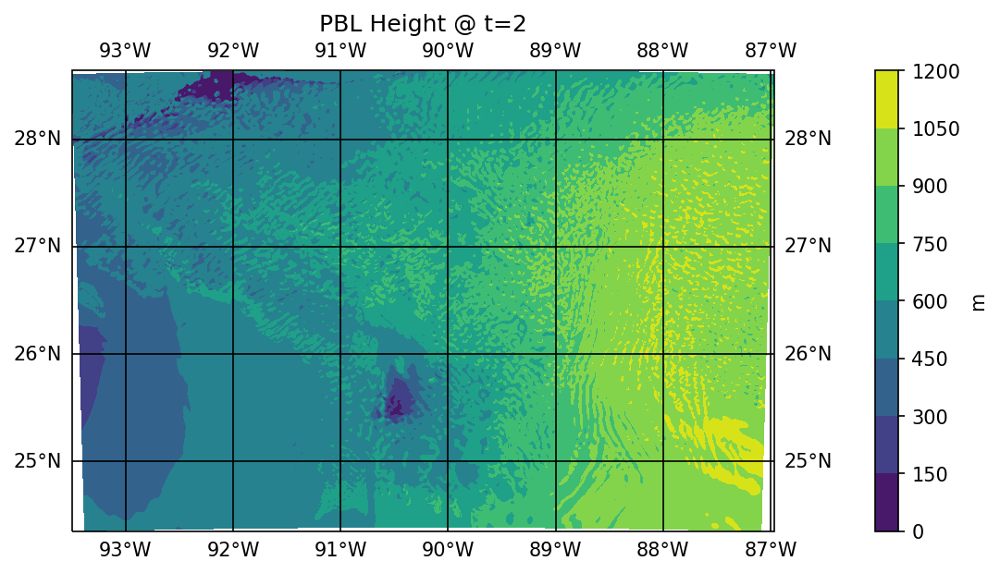

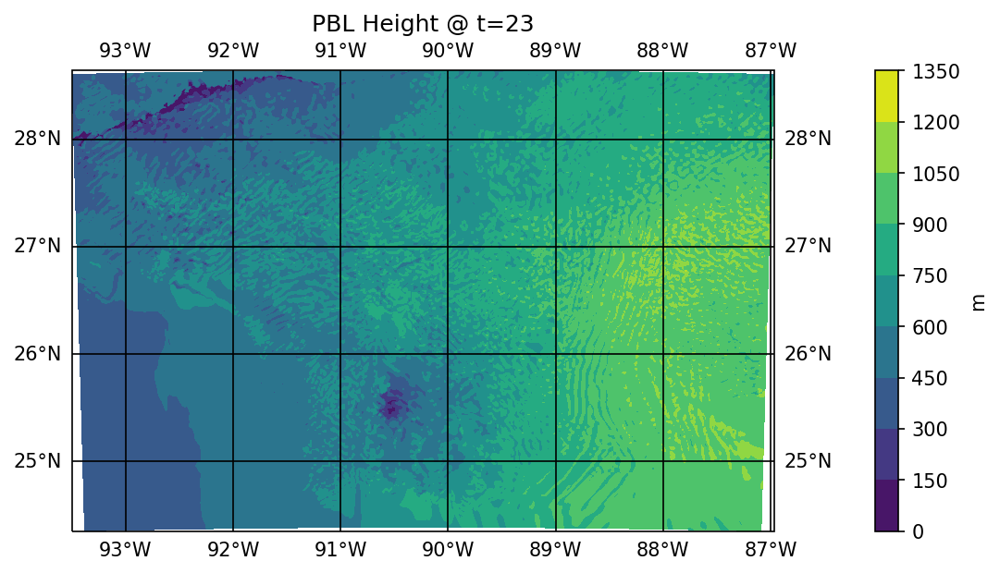

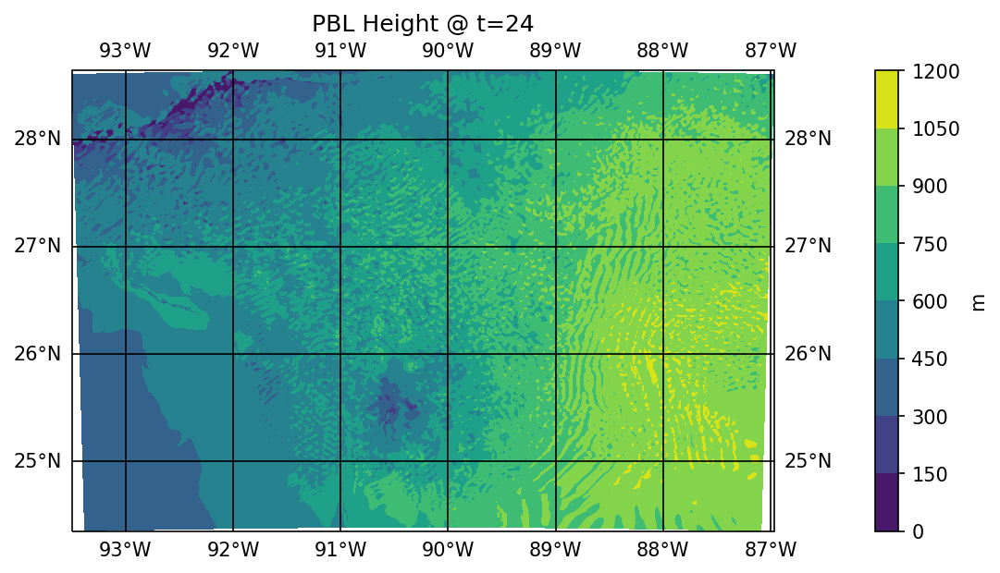

In [5]:
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_0[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PBLH_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_1[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PBLH_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_2[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PBLH_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_3[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PBLH_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_4[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PBLH_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_7[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=7')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_8[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=8')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_9[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=9')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_10[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=10')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_11[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=11')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_12[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=12')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_13[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=13')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_14[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=14')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_15[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=15')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_16[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=16')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_17[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=17')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_18[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=18')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_19[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=19')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_20[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=20')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_21[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=21')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_22[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_23[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=23')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], PBLH_24[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=24')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PBLH_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()

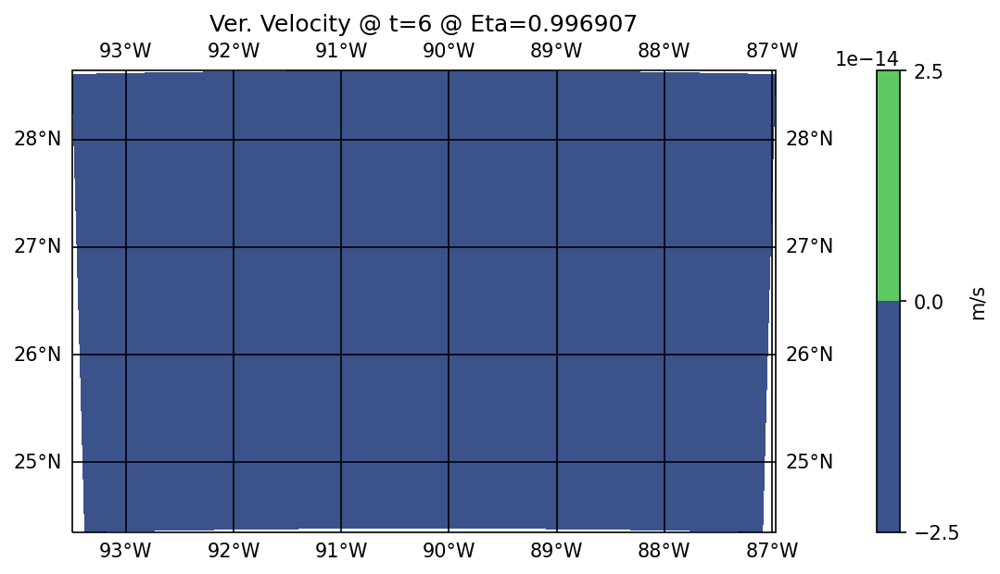

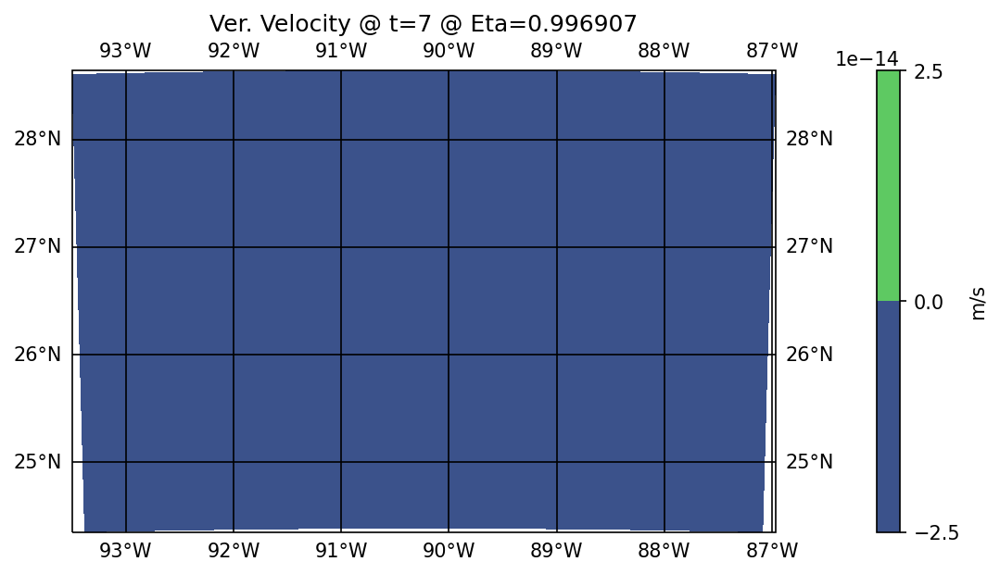

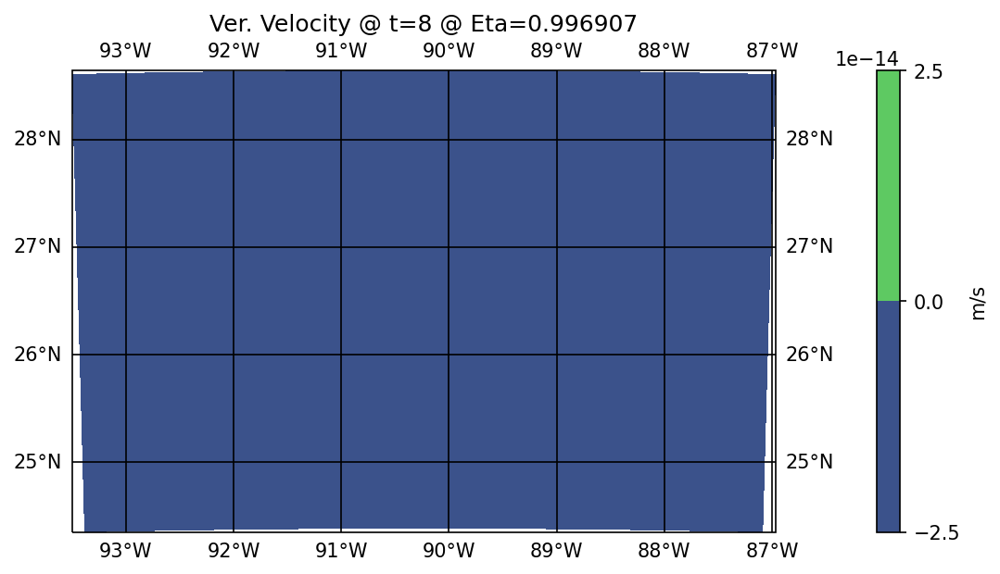

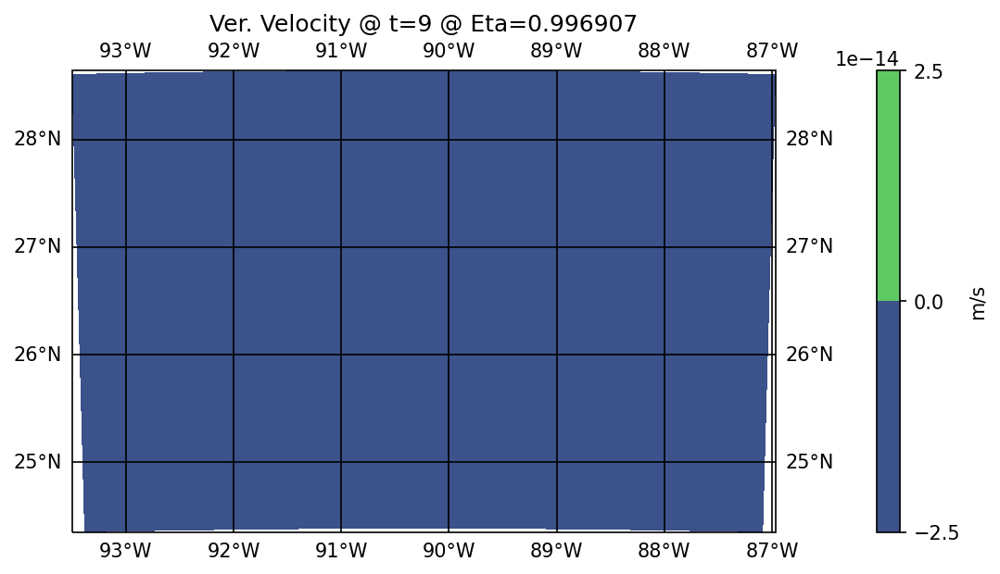

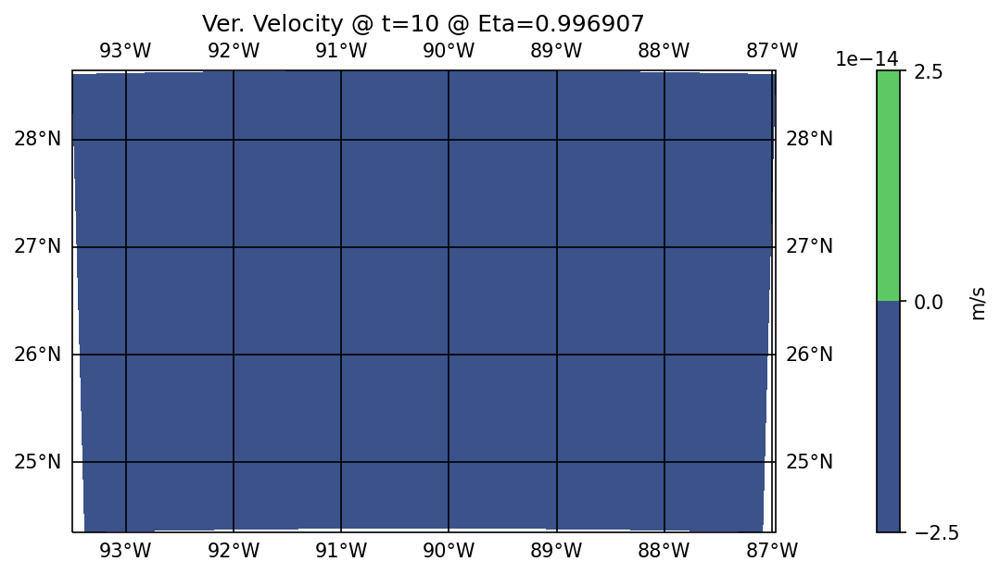

...

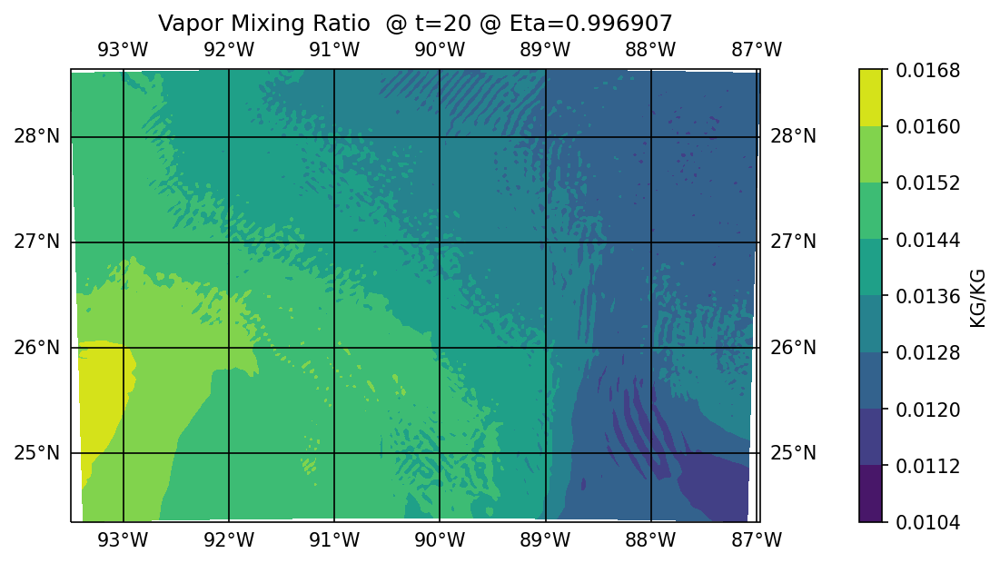

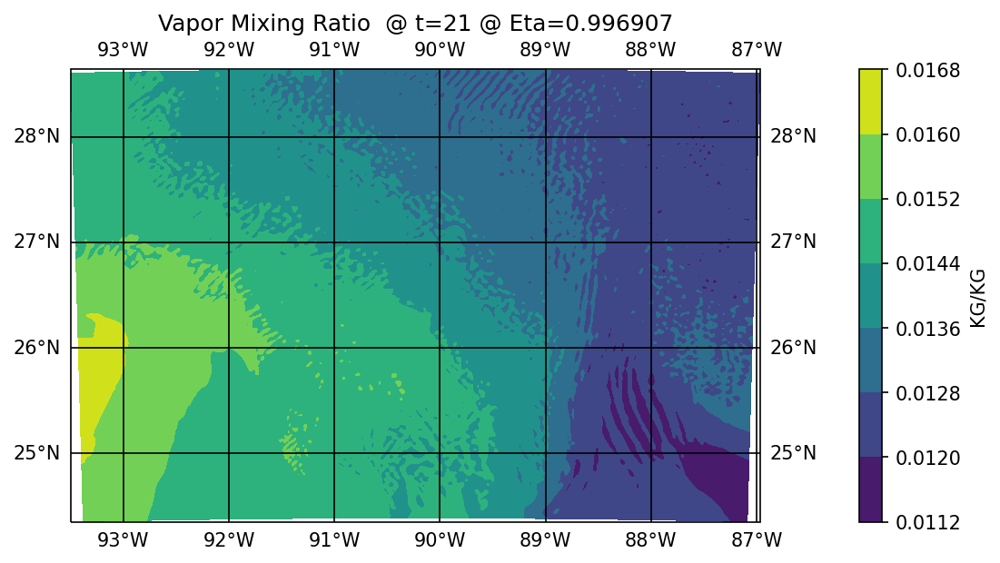

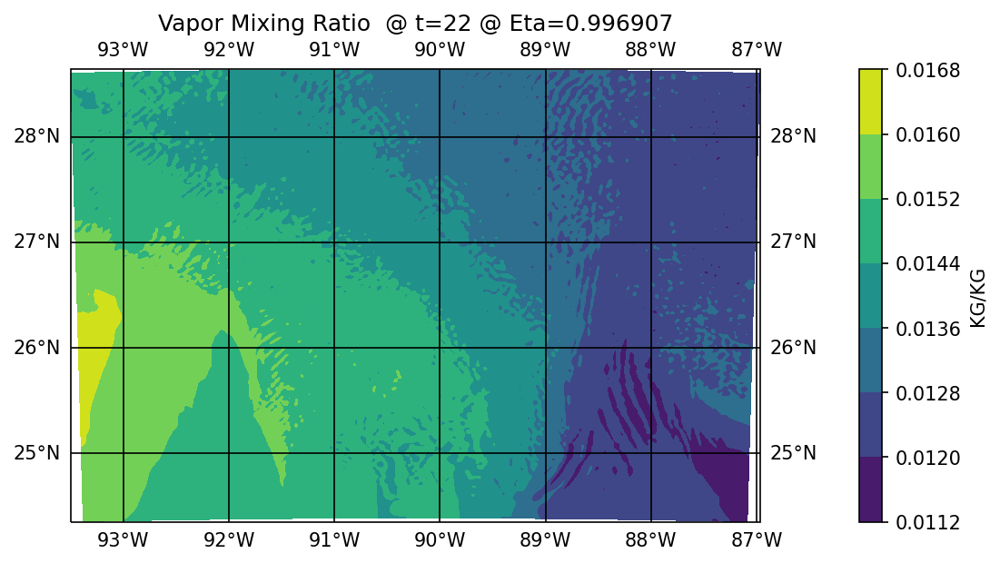

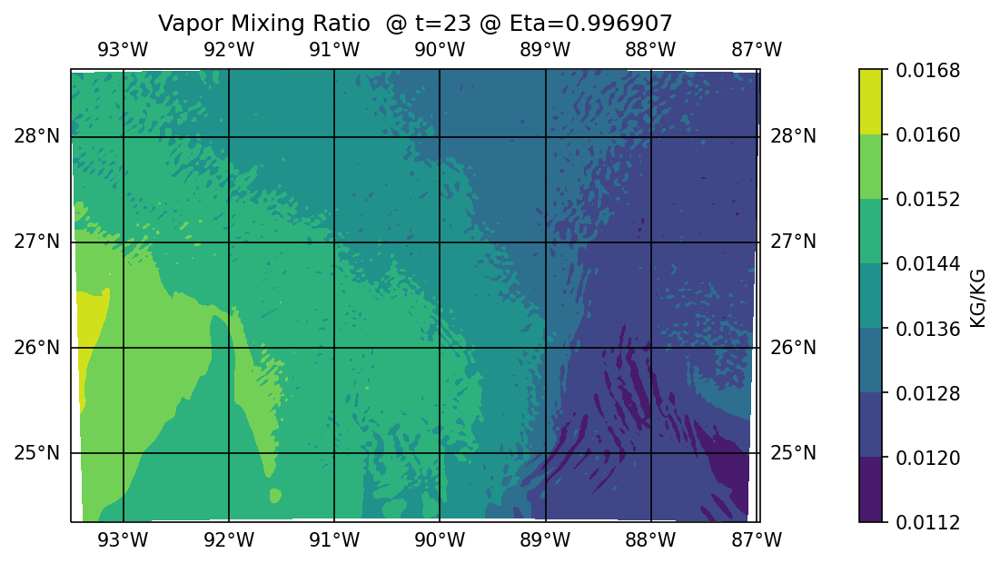

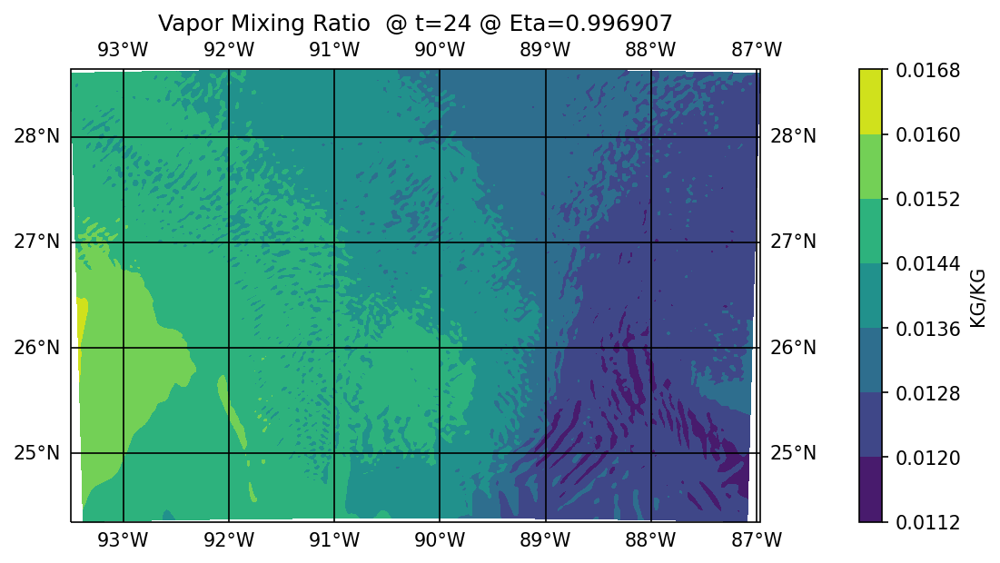

In [6]:
#Eta0
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_0[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=0 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta0_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_1[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=1 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta0_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_2[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=2 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta0_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_3[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=3 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta0_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_4[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=4 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta0_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_5[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=5 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta0_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_6[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=6 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_7[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=7 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_8[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=8 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_9[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=9 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_10[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=10 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_11[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=11 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_12[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=12 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_13[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=13 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_14[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=14 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_15[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=15 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_16[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=16 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_17[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=17 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_18[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=18 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_19[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=19 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_20[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=20 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_21[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=21 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_22[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=22 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_23[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=23 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_24[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=24 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta0_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#######################################################################################
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_0[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=0 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta0_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_1[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=1 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta0_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_2[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=2 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta0_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_3[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=3 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta0_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_4[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=4 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta0_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_5[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=5 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta0_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_6[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=6 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_7[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=7 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_8[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=8 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_9[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=9 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_10[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=10 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_11[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=1 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_12[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=12 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_13[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=13 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_14[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=14 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_15[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=15 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_16[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=16 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_17[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=17 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_18[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=18 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_19[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=19 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_20[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=20 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_21[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=21 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_22[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=22 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_23[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=23 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_24[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=24 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta0_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#########################################
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_0[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=0 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta0_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_1[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=1 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta0_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_2[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=2 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta0_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_3[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=3 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta0_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_4[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=4 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta0_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_5[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=5 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta0_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_6[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=6 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_7[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=7 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_8[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=8 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_9[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=9 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_10[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=10 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_11[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=1 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_12[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=12 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_13[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=13 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_14[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=14 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_15[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=15 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_16[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=16 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_17[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=17 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_18[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=18 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_19[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=19 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_20[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=20 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_21[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=21 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_22[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=22 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_23[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=23 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_24[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=24 @ Eta=0.996907')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta0_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()


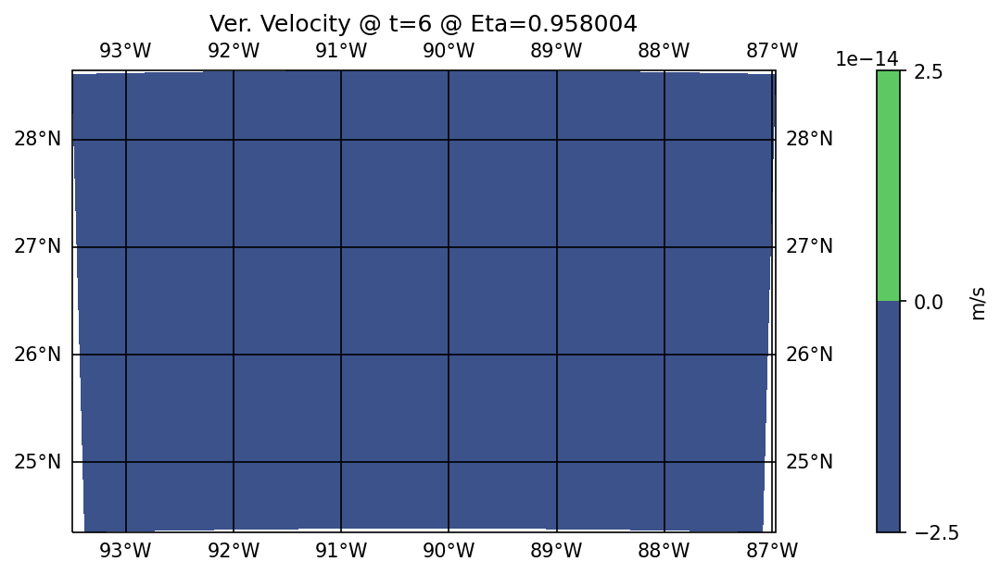

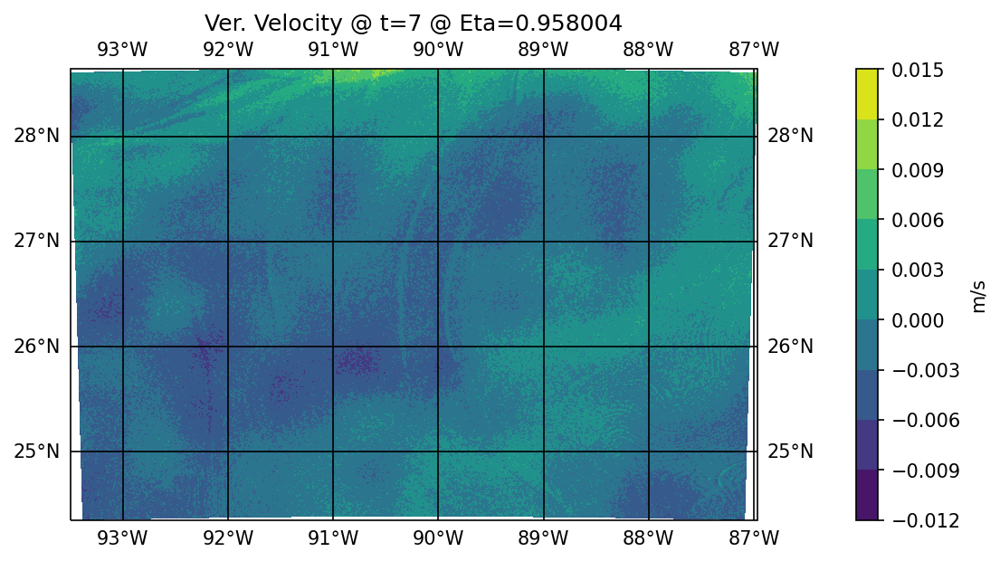

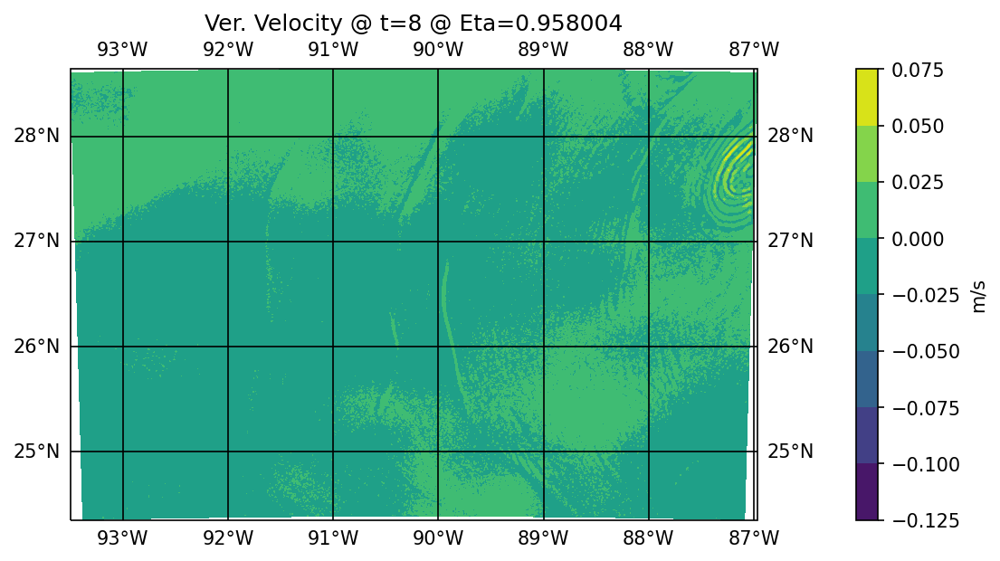

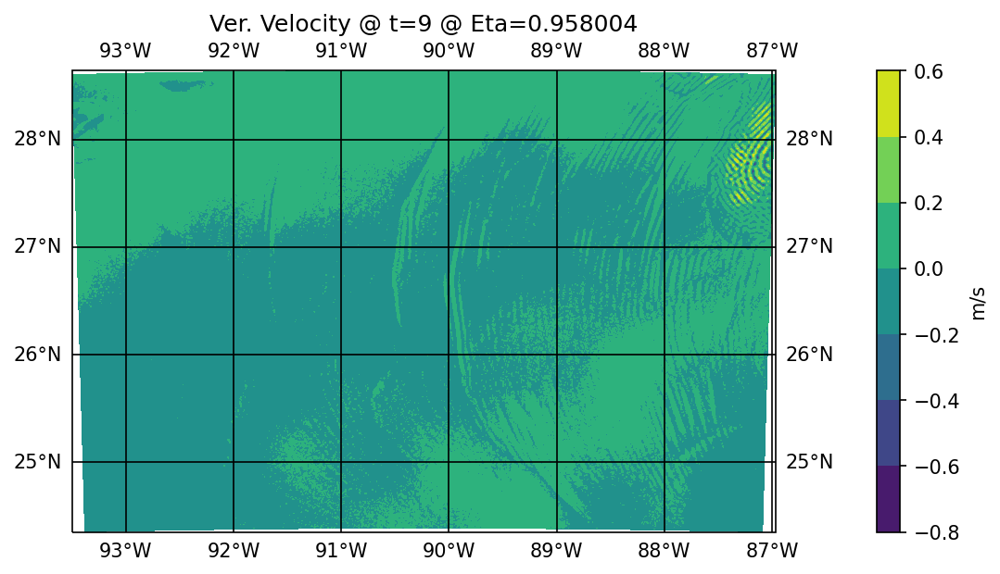

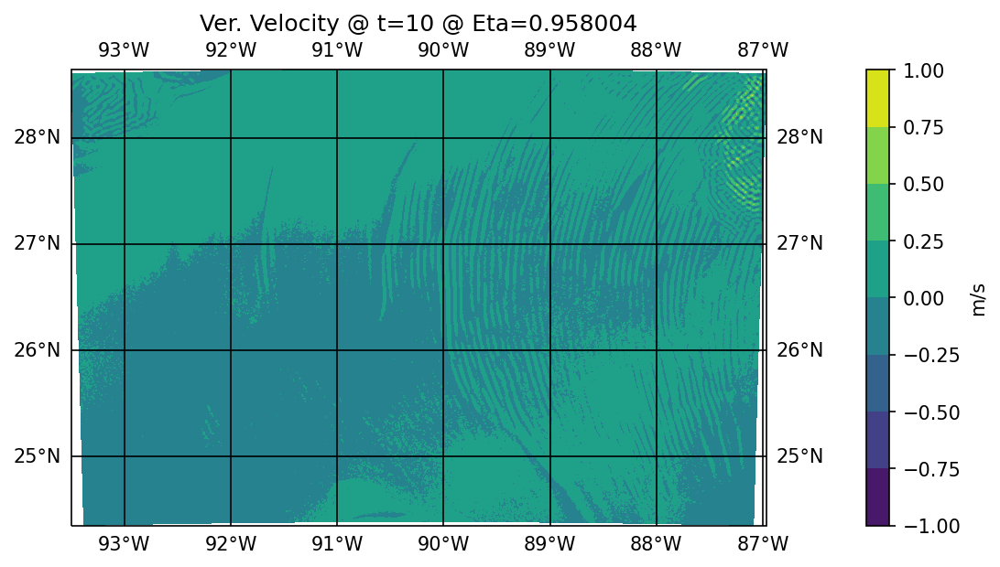

...

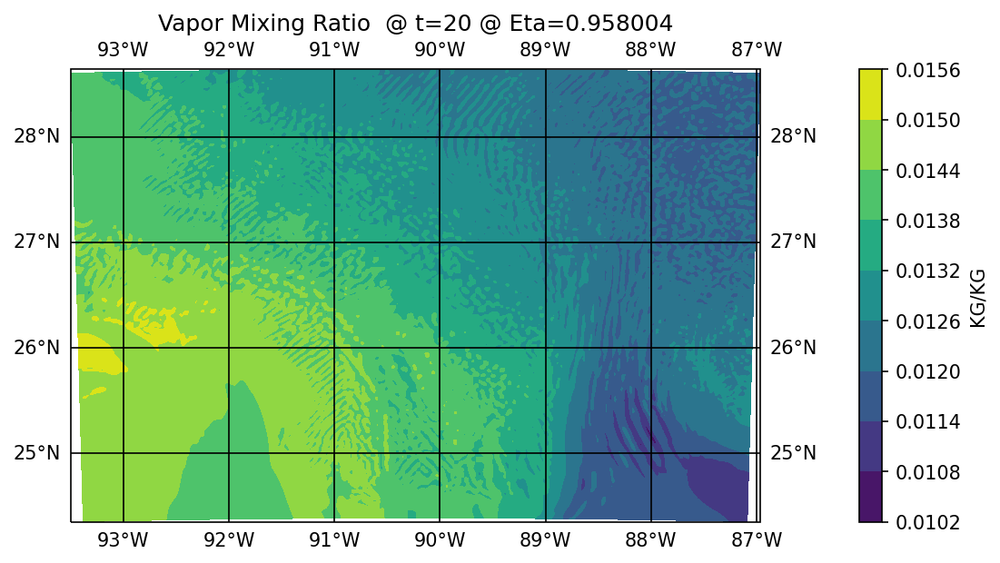

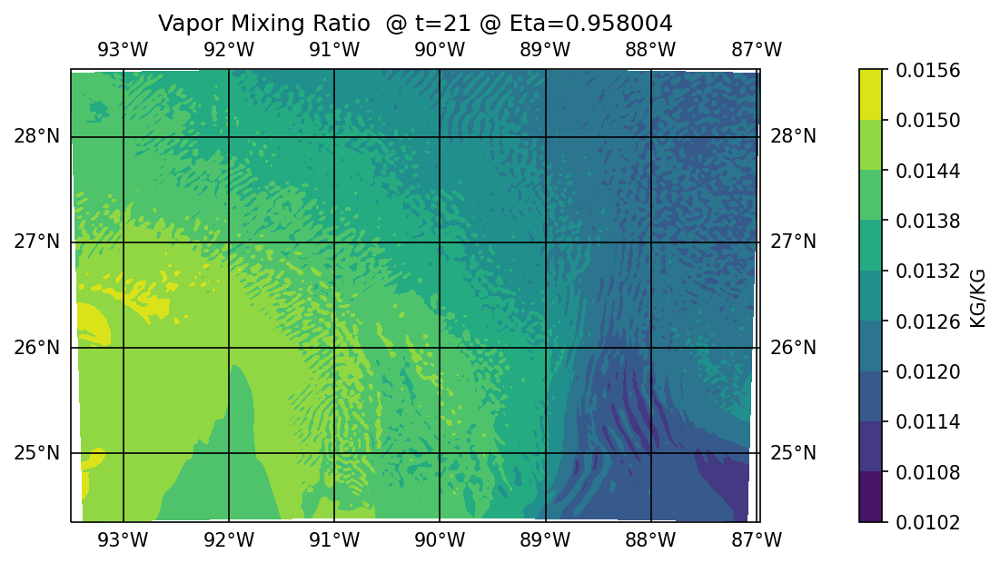

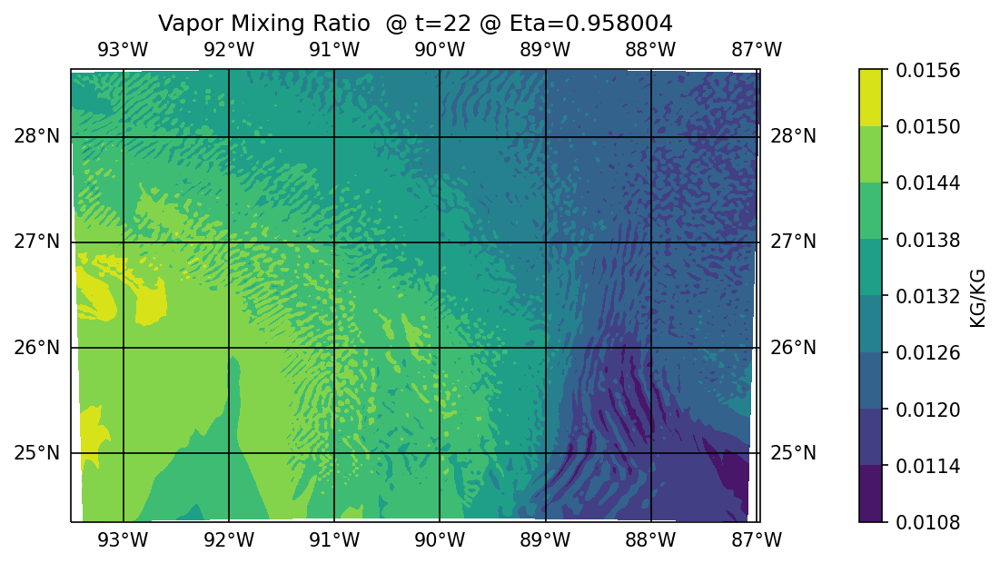

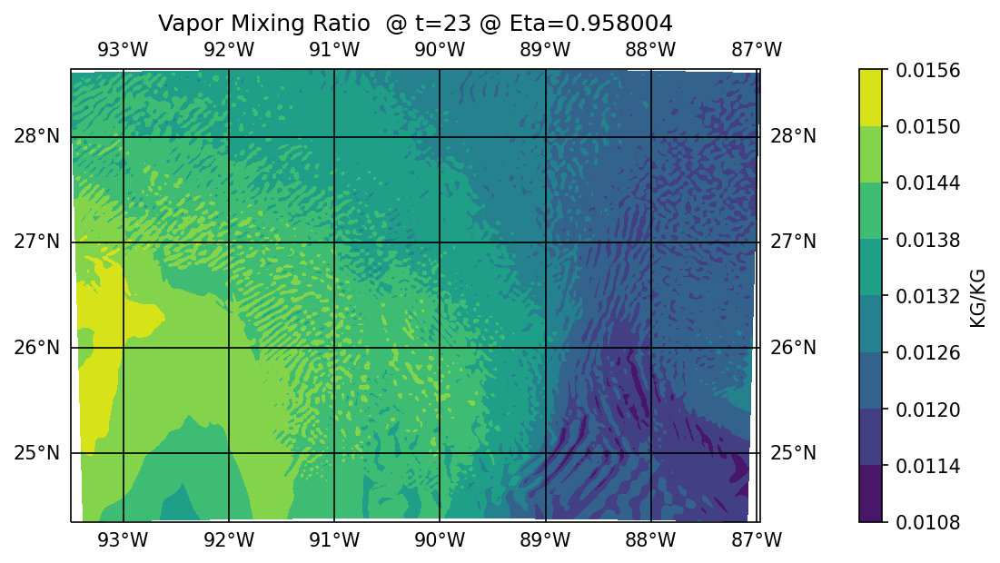

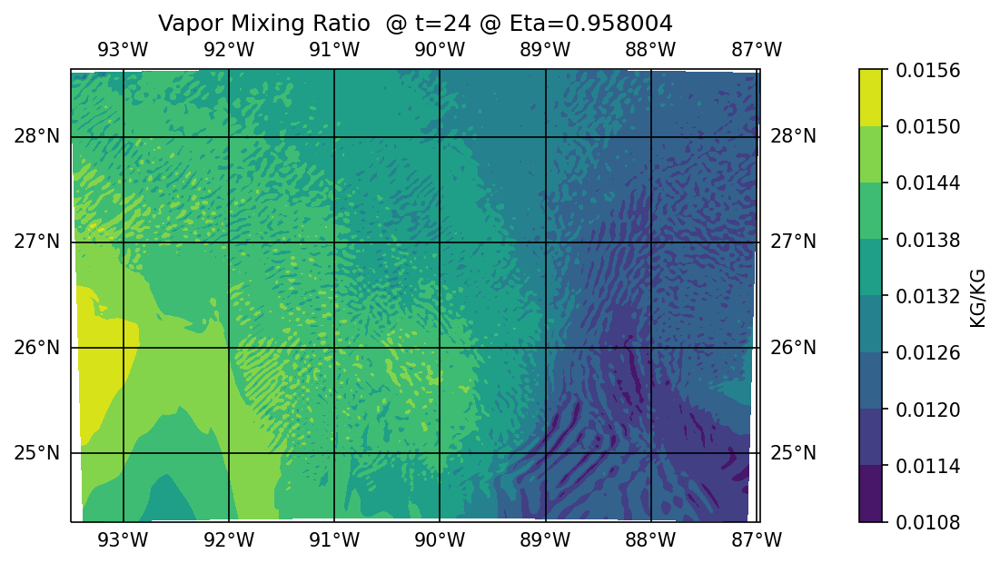

In [7]:
#Eta5
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_0[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=0 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta5_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_1[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=1 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta5_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_2[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=2 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta5_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_3[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=3 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta5_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_4[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=4 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta5_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_5[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=5 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta5_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_6[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=6 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_7[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=7 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_8[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=8 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_9[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=9 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_10[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=10 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_11[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=11 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_12[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=12 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_13[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=13 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_14[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=14 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_15[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=15 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_16[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=16 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_17[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=17 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_18[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=18 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_19[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=19 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_20[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=20 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_21[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=21 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_22[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=22 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_23[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=23 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_24[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=24 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta5_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#######################################################################################
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_0[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=0 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta5_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_1[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=1 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta5_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_2[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=2 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta5_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_3[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=3 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta5_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_4[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=4 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta5_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_5[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=5 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta5_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_6[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=6 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_7[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=7 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_8[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=8 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_9[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=9 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_10[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=10 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_11[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=11 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_12[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=12 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_13[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=13 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_14[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=14 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_13[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=15 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_16[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=16 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_17[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=17 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_18[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=18 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_19[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=19 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_20[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=20 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_21[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=21 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_22[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=22 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_23[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=23 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_24[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=24 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta5_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()

####################################################
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_0[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=0 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta5_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_1[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=1 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta5_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_2[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=2 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta5_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_3[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=3 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta5_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_4[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=4 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta5_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_5[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=5 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta5_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_6[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=6 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_7[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=7 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_8[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=8 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_9[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=9 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_10[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=10 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_11[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=11 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_12[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=12 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_13[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=13 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_14[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=14 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_15[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=15 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_16[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=16 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_17[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=17 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_18[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=18 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_19[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=19 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_20[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=20 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_21[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=21 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_22[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=22 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_23[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=23 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_24[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=24 @ Eta=0.958004')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta5_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()


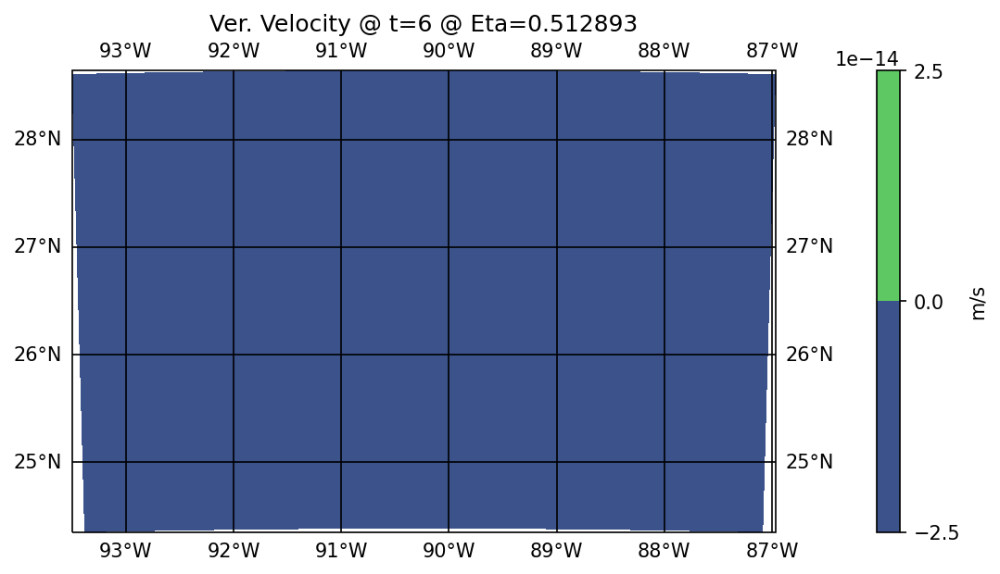

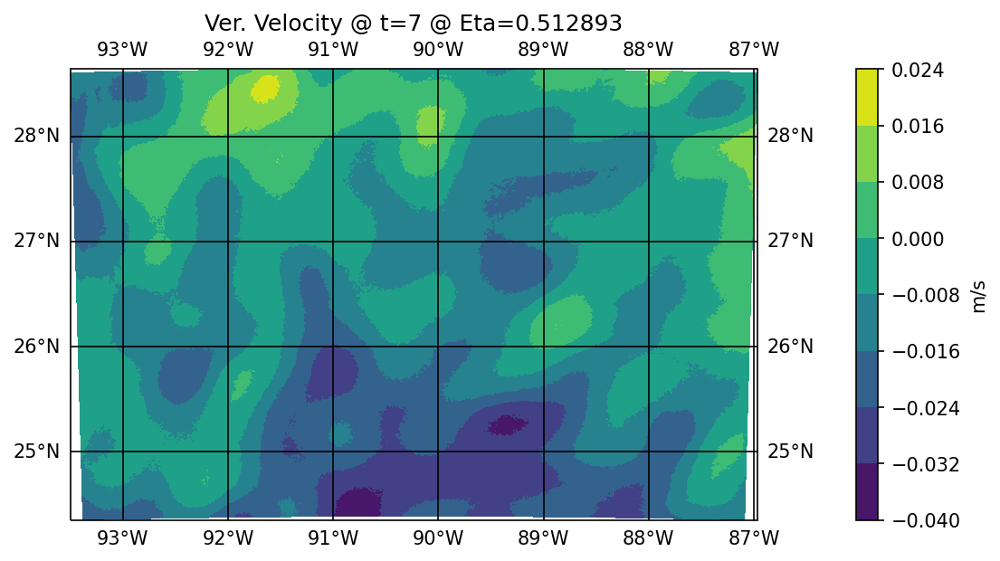

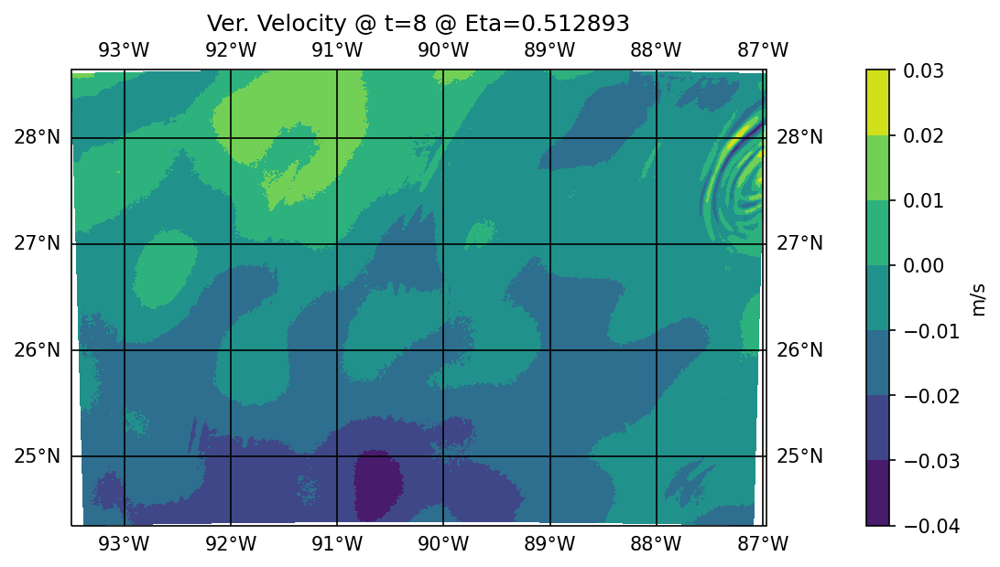

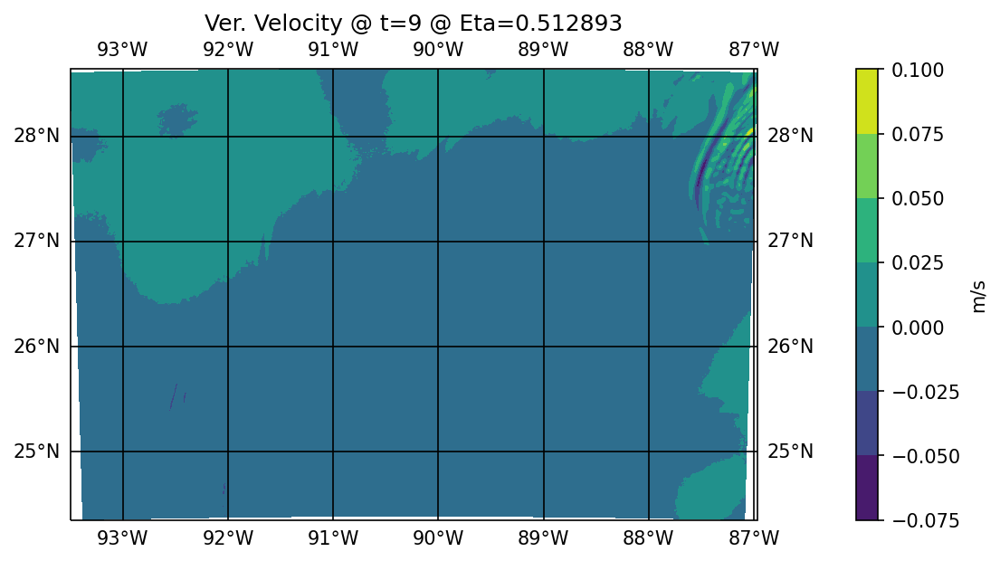

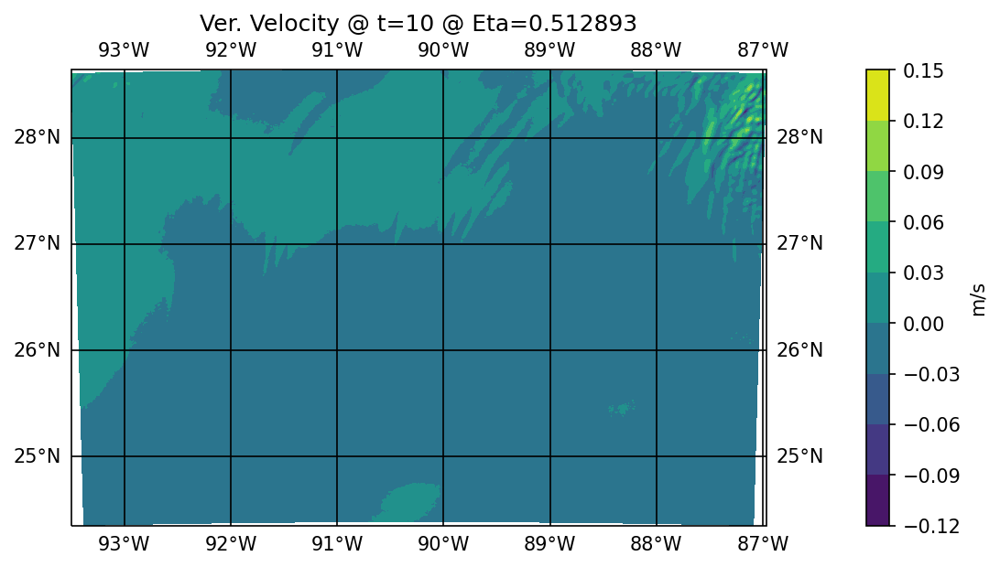

...

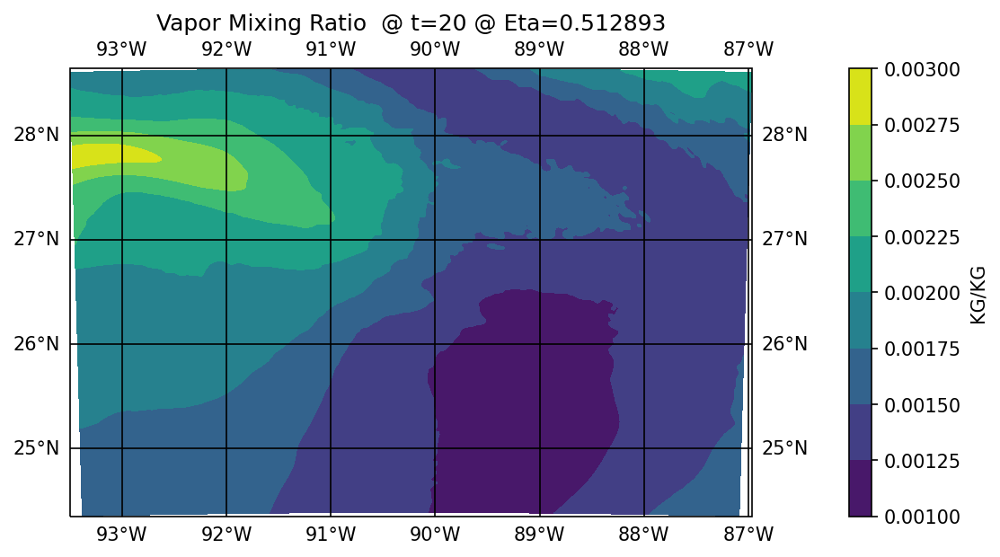

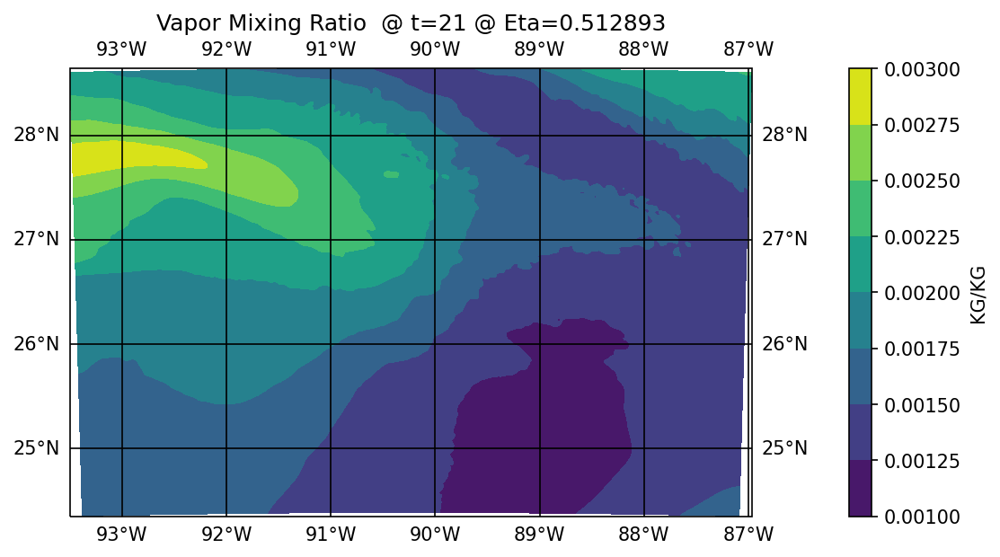

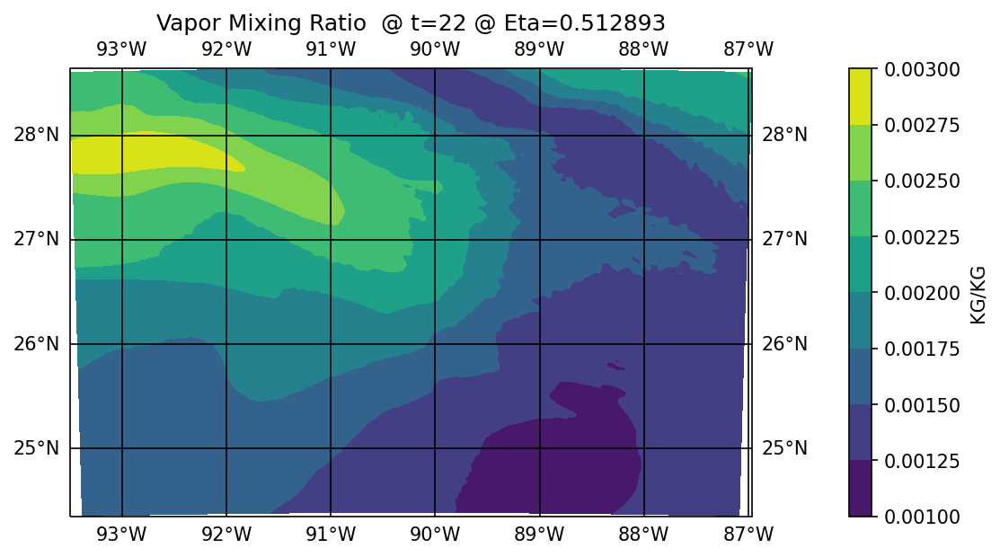

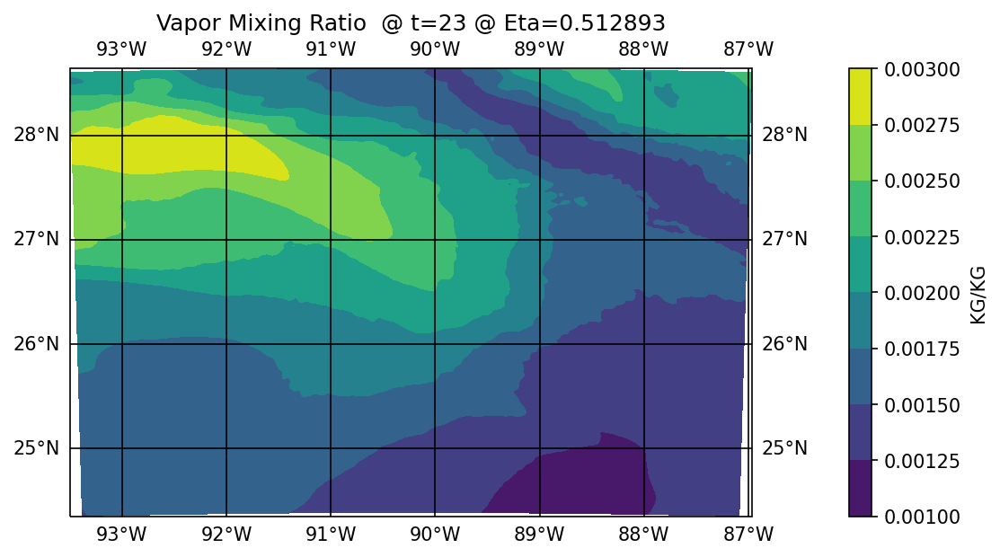

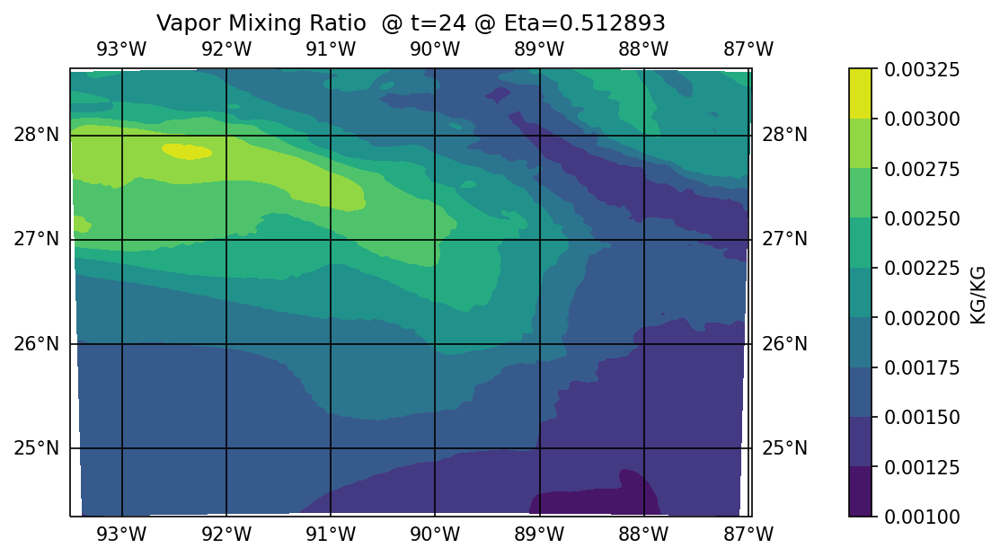

In [8]:
#Eta28
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_0[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=0 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta28_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_1[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=1 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta28_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_2[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=2 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta28_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_3[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=3 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta28_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_4[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=4 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta28_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_5[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=5 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'w_eta28_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_6[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=6 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_7[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=7 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_8[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=8 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_9[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=9 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_10[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=10 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_11[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=11 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_12[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=12 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta20_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_13[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=13 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_14[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=14 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_15[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=15 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_16[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=16 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_17[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=17 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_18[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=18 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_19[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=19 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_20[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=20 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_21[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=21 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_22[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=22 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_23[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=23 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], w_24[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Ver. Velocity @ t=24 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'w_eta28_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#######################################################################################
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_0[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=0 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta28_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_1[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=1 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta28_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_2[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=2 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta28_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_3[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=3 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta28_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_4[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=4 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta28_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_5[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=5 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'PoT_eta28_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_6[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=6 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_7[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=7 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_8[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=8 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_9[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=9 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_10[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=10 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_11[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=11 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_12[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=12 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_13[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=13 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_14[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=14 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_15[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=15 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_16[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=16 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_17[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=17 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_18[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=18 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_19[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=19 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_20[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=20 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_21[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=21 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_22[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=22 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_23[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=23 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], poT_24[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'K')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Pot. Temp. @ t=24 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'PoT_eta28_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()

####################################################
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_0[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=0 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta28_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_1[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=1 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta28_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_2[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio @ t=2 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta28_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_3[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=3 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta28_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_4[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=4 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta28_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_5[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=5 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/D3out/'
plt.savefig(save_results_to + 'QV_eta28_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()
'''
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_6[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=6 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_7[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=7 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_8[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=8 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_9[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=9 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_10[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=10 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_11[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=11 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_12[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=12 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_13[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=13 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_14[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=14 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_15[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=15 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_16[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=16 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_17[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=17 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_18[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=18 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_19[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=19 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time19.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_20[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=20 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time20.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_21[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=21 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time21.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_22[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=22 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time22.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_23[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=23 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time23.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(lon0[0,:,:], lat0[0,:,:], VMR_24[0,28,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'KG/KG')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vapor Mixing Ratio  @ t=24 @ Eta=0.512893')
save_results_to = '/Users/Anna/Desktop/WRF/shortRun/'
plt.savefig(save_results_to + 'QV_eta28_time24.png', bbox_inches = 'tight',dpi = 150)
plt.show()
